In [91]:
import numpy as np
import pandas as pd

# Data cleaning

## Data discovery

In [92]:
data=pd.read_csv("data.csv")

In [93]:
data.dtypes.value_counts()

float64    93
int64       3
dtype: int64

In [94]:
isnulltable=pd.DataFrame(data.isna().sum(), columns=["value"])

In [95]:
isnulltable.reset_index()

,index,value
0,Bankrupt?,0
1,ROA(C) before interest and depreciation befor...,0
2,ROA(A) before interest and % after tax,0
3,ROA(B) before interest and depreciation after...,0
4,Operating Gross Margin,0
5,Realized Sales Gross Margin,0
6,Operating Profit Rate,0
7,Pre-tax net Interest Rate,0
8,After-tax net Interest Rate,0
9,Non-industry income and expenditure/revenue,0


In [96]:
isnulltable.loc[isnulltable["value"]>0]

,value


In [97]:
data.describe()
# 6819 rows 
# 96 columns 


,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,...,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00
mean,0.03,0.51,0.56,0.55,0.61,0.61,1.00,0.80,0.81,0.30,...,0.81,18629417.81,0.62,0.61,0.84,0.28,0.03,0.57,1.00,0.05
std,0.18,0.06,0.07,0.06,0.02,0.02,0.01,0.01,0.01,0.01,...,0.04,376450059.75,0.01,0.02,0.01,0.01,0.02,0.01,0.00,0.05
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
25%,0.00,0.48,0.54,0.53,0.60,0.60,1.00,0.80,0.81,0.30,...,0.80,0.00,0.62,0.60,0.84,0.28,0.03,0.57,1.00,0.02
50%,0.00,0.50,0.56,0.55,0.61,0.61,1.00,0.80,0.81,0.30,...,0.81,0.00,0.62,0.61,0.84,0.28,0.03,0.57,1.00,0.03
75%,0.00,0.54,0.59,0.58,0.61,0.61,1.00,0.80,0.81,0.30,...,0.83,0.01,0.62,0.61,0.84,0.28,0.03,0.57,1.00,0.05
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,...,1.00,9820000000.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


<AxesSubplot:>

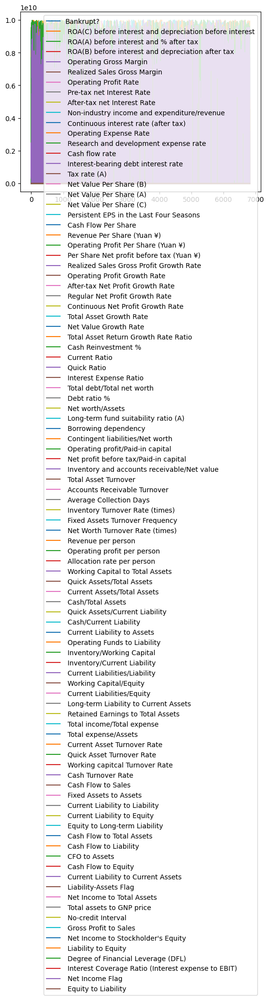

In [98]:
import matplotlib
from matplotlib import pyplot as plt 
data.plot()

## Correlations

In [99]:
# import pandas as pd
# import numpy as np

# df = pd.DataFrame({'A': [1,2,3,4,5],'B': [1,2,3,4,5], 'C':[7,3,89,2,40]})
# display(df)

# # # Create correlation matrix
# corr_matrix = df.corr().abs()
# # # Select upper triangle of correlation matrix
# upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
# # # Find features with correlation greater than 0.85
# to_drop = [column for column in upper.columns if any(upper[column] > 0.85)]

# print(f"Columns to drop: {to_drop}")
# print(f"Number of columns to drop; {len(to_drop)}")

# # # Drop features
# df.drop(to_drop, axis=1, inplace=True)
# display(df)

In [100]:
import seaborn as sns
data_matrix=data.corr()
data_matrix

for column in data_matrix:
    print(data_matrix[column].values)
# 
# for each column, 
# print column name, 
# if the value of the row is > to 0.9, 
# print the name of the row 


[ 1.00000000e+00 -2.60806558e-01 -2.82940585e-01 -2.73051318e-01
 -1.00043244e-01 -9.94452496e-02 -2.29817399e-04 -8.51654796e-03
 -8.85722326e-03 -1.65926376e-02 -8.39485899e-03 -6.08322551e-03
 -2.42319684e-02 -7.23555512e-02 -2.30628090e-02 -1.09705669e-01
 -1.65399021e-01 -1.65464759e-01 -1.64783924e-01 -2.19559681e-01
 -7.75164598e-02 -4.69203820e-03 -1.42050582e-01 -2.01394834e-01
 -4.58383763e-04 -1.51679461e-02 -3.77829729e-02 -3.68196768e-02
 -9.40090214e-03 -4.44310214e-02  6.53294244e-02 -1.68576794e-02
 -5.13452043e-02 -2.21128025e-03  2.50582887e-02 -2.68093382e-03
  1.23135860e-02  2.50160962e-01 -2.50160962e-01  1.69199048e-02
  1.76542936e-01  7.04545248e-02 -1.41111324e-01 -2.07856520e-01
  7.52780821e-02 -6.79151672e-02 -4.75386744e-03 -6.55553959e-03
 -1.37584476e-03  7.28182642e-02  2.10891883e-02  3.97184765e-02
 -9.28421410e-02  2.82880213e-03 -1.93083376e-01 -8.63821115e-02
 -4.48233389e-02 -1.00130190e-01 -3.82278014e-03  7.79210962e-02
  1.94494436e-01 -7.70819

In [101]:
mask=np.zeros_like(data_matrix, dtype=bool)
mask[np.triu_indices_from(mask)]= True

In [102]:
cmap=sns.diverging_palette(180, 180, as_cmap=True)

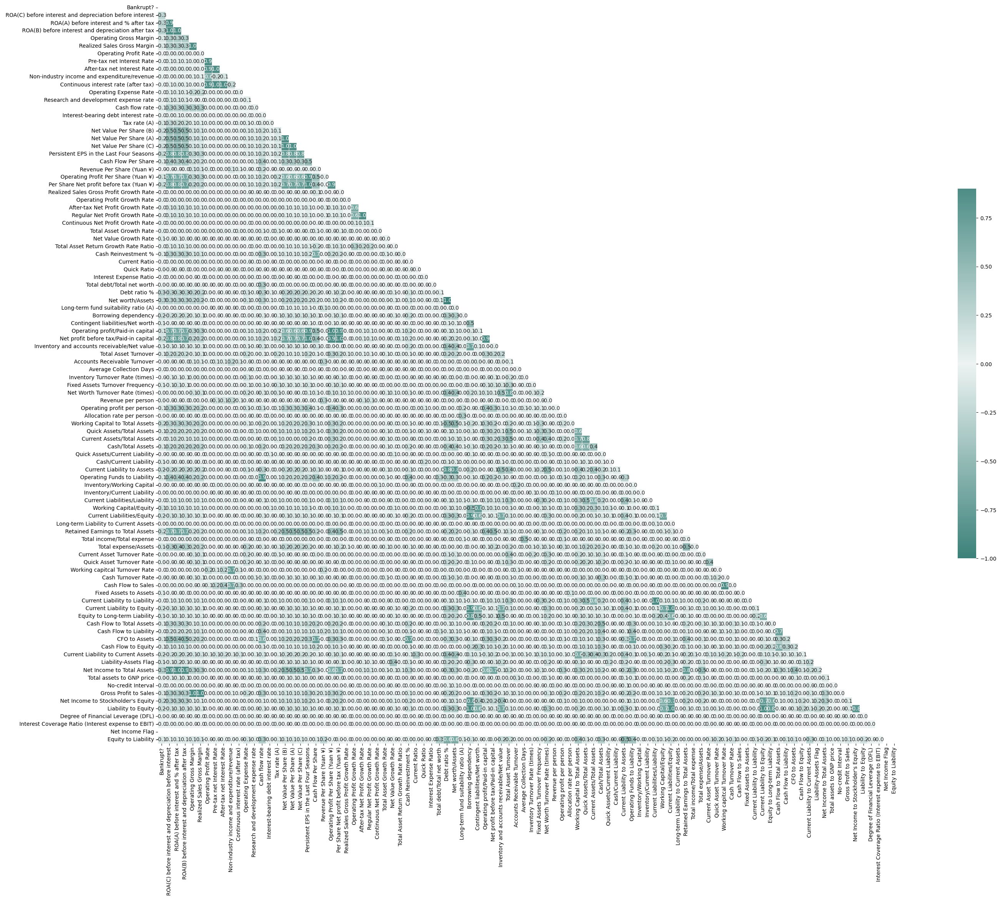

In [103]:
plt.figure(figsize=(40,25))
sns.plot = sns.heatmap(
    data_matrix, 
    mask=mask,
    cmap=cmap,
    vmax=.9,
    center=0,
    square=True,
    linewidths=.5,
    cbar_kws={"shrink": .5},
    annot=True, 
    fmt=".1f"
)

In [104]:
upper_tri = data_matrix.where(np.triu(np.ones(data_matrix.shape),k=1).astype(bool))

In [105]:
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.90)]

In [106]:
to_drop

[' ROA(A) before interest and % after tax',
 ' ROA(B) before interest and depreciation after tax',
 ' Realized Sales Gross Margin',
 ' Pre-tax net Interest Rate',
 ' After-tax net Interest Rate',
 ' Continuous interest rate (after tax)',
 ' Net Value Per Share (A)',
 ' Net Value Per Share (C)',
 ' Per Share Net profit before tax (Yuan ¥)',
 ' Regular Net Profit Growth Rate',
 ' Operating profit/Paid-in capital',
 ' Net profit before tax/Paid-in capital',
 ' Cash Flow to Sales',
 ' Current Liability to Liability',
 ' Current Liability to Equity',
 ' Net Income to Total Assets',
 ' Gross Profit to Sales',
 ' Liability to Equity']

In [107]:
data.drop(columns=to_drop, inplace=True)

In [108]:
# for column in data_matrix:
#     print(column)
#     for i in data_matrix[column].values:
#         if i > 0.9:
#             print(i)

In [109]:
# for (columnName, columnData) in data_matrix.iteritems():
#     print('Column Name :', columnName)
#     #if columnData.values >0.9:
#         print('Correlation Value:', columnData.values)
#         print('Row Index:', columnData.index)

## Dropping columns with low variance

In [110]:
data.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,Operating Gross Margin,Operating Profit Rate,Non-industry income and expenditure/revenue,Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),...,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Total assets to GNP price,No-credit Interval,Net Income to Stockholder's Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,...,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00
mean,0.03,0.51,0.61,1.00,0.30,1995347312.80,1950427306.06,0.47,16448012.91,0.12,...,0.32,0.03,0.00,18629417.81,0.62,0.84,0.03,0.57,1.00,0.05
std,0.18,0.06,0.02,0.01,0.01,3237683890.52,2598291554.00,0.02,108275033.53,0.14,...,0.01,0.03,0.03,376450059.75,0.01,0.01,0.02,0.01,0.00,0.05
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
25%,0.00,0.48,0.60,1.00,0.30,0.00,0.00,0.46,0.00,0.00,...,0.31,0.02,0.00,0.00,0.62,0.84,0.03,0.57,1.00,0.02
50%,0.00,0.50,0.61,1.00,0.30,0.00,509000000.00,0.47,0.00,0.07,...,0.31,0.03,0.00,0.00,0.62,0.84,0.03,0.57,1.00,0.03
75%,0.00,0.54,0.61,1.00,0.30,4145000000.00,3450000000.00,0.47,0.00,0.21,...,0.32,0.04,0.00,0.01,0.62,0.84,0.03,0.57,1.00,0.05
max,1.00,1.00,1.00,1.00,1.00,9990000000.00,9980000000.00,1.00,990000000.00,1.00,...,1.00,1.00,1.00,9820000000.00,1.00,1.00,1.00,1.00,1.00,1.00


In [111]:
pd.set_option('display.max_rows', None)
pd.options.display.float_format='{:.2f}'.format

In [112]:
low_var_table= data.var().to_frame().sort_values(by=0)


In [113]:
todrop2=low_var_table.loc[low_var_table[0]<0.01].T.columns.tolist()

In [114]:
data.drop(columns=todrop2, inplace=True)

## Checking odd values/ missing/ 0

In [115]:
data.describe()

,Bankrupt?,Operating Expense Rate,Research and development expense rate,Interest-bearing debt interest rate,Tax rate (A),Revenue Per Share (Yuan ¥),Total Asset Growth Rate,Net Value Growth Rate,Current Ratio,Quick Ratio,...,Quick Assets/Current Liability,Cash/Current Liability,Inventory/Current Liability,Current Liabilities/Liability,Long-term Liability to Current Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Cash Turnover Rate,Fixed Assets to Assets,Total assets to GNP price
count,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,...,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00
mean,0.03,1995347312.80,1950427306.06,16448012.91,0.12,1328640.60,5508096595.25,1566212.06,403284.95,8376594.82,...,3592902.20,37159994.15,55806804.53,0.76,54160038.14,1195855763.31,2163735272.03,2471976967.44,1220120.50,18629417.81
std,0.18,3237683890.52,2598291554.00,108275033.53,0.14,51707089.77,2897717771.17,114159389.52,33302155.83,244684748.45,...,171620908.61,510350903.16,582051554.62,0.21,570270621.96,2821161238.26,3374944402.17,2938623226.68,100754158.71,376450059.75
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,0.00,0.00,0.02,4860000000.00,0.00,0.01,0.00,...,0.01,0.00,0.00,0.63,0.00,0.00,0.00,0.00,0.09,0.00
50%,0.00,0.00,509000000.00,0.00,0.07,0.03,6400000000.00,0.00,0.01,0.01,...,0.01,0.00,0.01,0.81,0.00,0.00,0.00,1080000000.00,0.20,0.00
75%,0.00,4145000000.00,3450000000.00,0.00,0.21,0.05,7390000000.00,0.00,0.02,0.01,...,0.01,0.01,0.01,0.94,0.01,0.00,4900000000.00,4510000000.00,0.37,0.01
max,1.00,9990000000.00,9980000000.00,990000000.00,1.00,3020000000.00,9990000000.00,9330000000.00,2750000000.00,9230000000.00,...,8820000000.00,9650000000.00,9910000000.00,1.00,9540000000.00,10000000000.00,10000000000.00,10000000000.00,8320000000.00,9820000000.00


In [116]:
data.loc[~(data==0).all(axis=1)]

,Bankrupt?,Operating Expense Rate,Research and development expense rate,Interest-bearing debt interest rate,Tax rate (A),Revenue Per Share (Yuan ¥),Total Asset Growth Rate,Net Value Growth Rate,Current Ratio,Quick Ratio,...,Quick Assets/Current Liability,Cash/Current Liability,Inventory/Current Liability,Current Liabilities/Liability,Long-term Liability to Current Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Cash Turnover Rate,Fixed Assets to Assets,Total assets to GNP price
0,1,0.00,0.00,0.00,0.00,0.02,4980000000.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.68,0.03,701000000.00,6550000000.00,458000000.00,0.42,0.01
1,1,0.00,0.00,0.00,0.00,0.02,6110000000.00,0.00,0.01,0.00,...,0.00,0.00,0.01,0.31,0.02,0.00,7700000000.00,2490000000.00,0.47,0.01
2,1,0.00,25500000.00,0.00,0.00,0.01,7280000000.00,0.00,0.01,0.01,...,0.01,5340000000.00,0.01,0.45,0.00,0.00,0.00,761000000.00,0.28,0.04
3,1,0.00,0.00,0.00,0.00,0.01,4880000000.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.62,0.02,8140000000.00,6050000000.00,2030000000.00,0.56,0.00
4,1,7890000000.00,0.00,0.00,0.00,0.03,5510000000.00,0.00,0.01,0.00,...,0.00,0.00,0.00,0.98,0.00,6680000000.00,5050000000.00,824000000.00,0.31,0.00
5,1,0.00,0.00,0.00,0.00,0.02,608000000.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.73,0.00,8010000000.00,2810000000.00,295000000.00,0.60,0.01
6,0,0.00,730000000.00,0.00,0.00,0.03,5720000000.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.51,0.01,0.00,9560000000.00,2390000000.00,0.36,0.02
7,0,9000000000.00,50900000.00,0.00,0.16,0.04,6630000000.00,0.00,0.01,0.01,...,0.01,0.00,0.01,0.76,0.01,7290000000.00,6180000000.00,734000000.00,0.22,0.01
8,0,0.00,0.00,0.00,0.01,0.03,6890000000.00,0.00,0.01,0.01,...,0.01,0.01,0.00,0.91,0.00,0.00,9840000000.00,0.00,0.32,0.00
9,0,5820000000.00,0.00,0.00,0.39,0.08,5550000000.00,0.00,0.01,0.01,...,0.01,0.00,0.01,0.73,0.00,5110000000.00,3600000000.00,258000000.00,0.25,0.01


In [117]:
#sns.pairplot(data, hue='bankrupt')

In [118]:
pd.set_option('display.max_rows', 100)

# Data preprocessing

In [119]:
data.describe()

,Bankrupt?,Operating Expense Rate,Research and development expense rate,Interest-bearing debt interest rate,Tax rate (A),Revenue Per Share (Yuan ¥),Total Asset Growth Rate,Net Value Growth Rate,Current Ratio,Quick Ratio,...,Quick Assets/Current Liability,Cash/Current Liability,Inventory/Current Liability,Current Liabilities/Liability,Long-term Liability to Current Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Cash Turnover Rate,Fixed Assets to Assets,Total assets to GNP price
count,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,...,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00,6819.00
mean,0.03,1995347312.80,1950427306.06,16448012.91,0.12,1328640.60,5508096595.25,1566212.06,403284.95,8376594.82,...,3592902.20,37159994.15,55806804.53,0.76,54160038.14,1195855763.31,2163735272.03,2471976967.44,1220120.50,18629417.81
std,0.18,3237683890.52,2598291554.00,108275033.53,0.14,51707089.77,2897717771.17,114159389.52,33302155.83,244684748.45,...,171620908.61,510350903.16,582051554.62,0.21,570270621.96,2821161238.26,3374944402.17,2938623226.68,100754158.71,376450059.75
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,0.00,0.00,0.02,4860000000.00,0.00,0.01,0.00,...,0.01,0.00,0.00,0.63,0.00,0.00,0.00,0.00,0.09,0.00
50%,0.00,0.00,509000000.00,0.00,0.07,0.03,6400000000.00,0.00,0.01,0.01,...,0.01,0.00,0.01,0.81,0.00,0.00,0.00,1080000000.00,0.20,0.00
75%,0.00,4145000000.00,3450000000.00,0.00,0.21,0.05,7390000000.00,0.00,0.02,0.01,...,0.01,0.01,0.01,0.94,0.01,0.00,4900000000.00,4510000000.00,0.37,0.01
max,1.00,9990000000.00,9980000000.00,990000000.00,1.00,3020000000.00,9990000000.00,9330000000.00,2750000000.00,9230000000.00,...,8820000000.00,9650000000.00,9910000000.00,1.00,9540000000.00,10000000000.00,10000000000.00,10000000000.00,8320000000.00,9820000000.00


/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


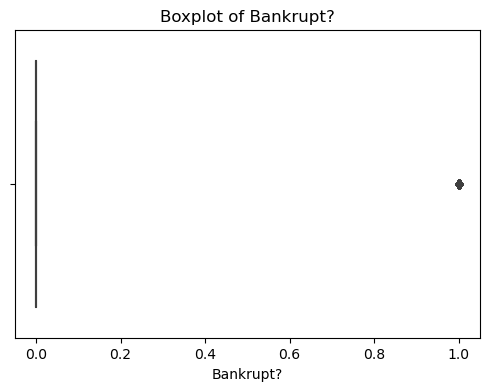

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


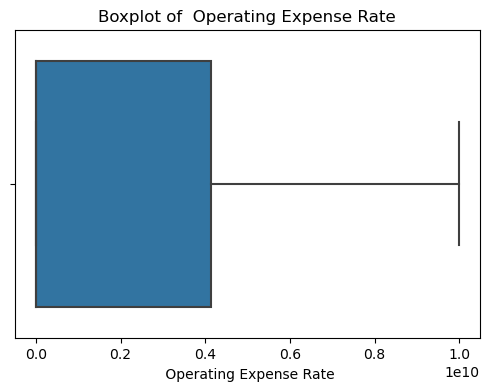

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


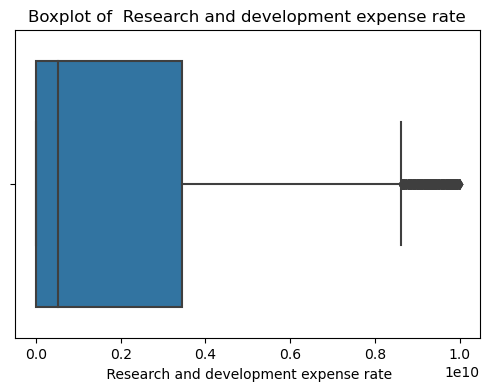

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


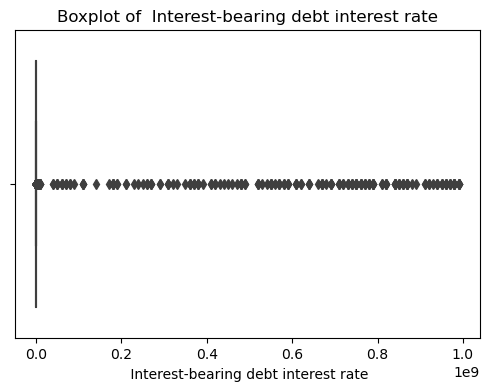

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


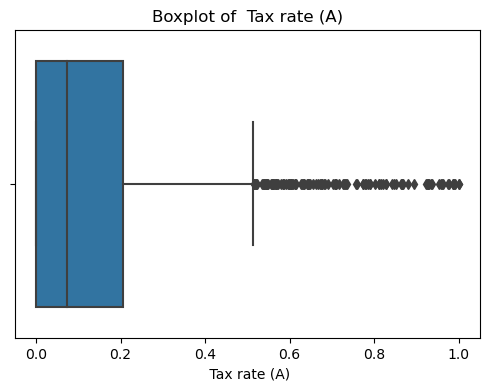

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


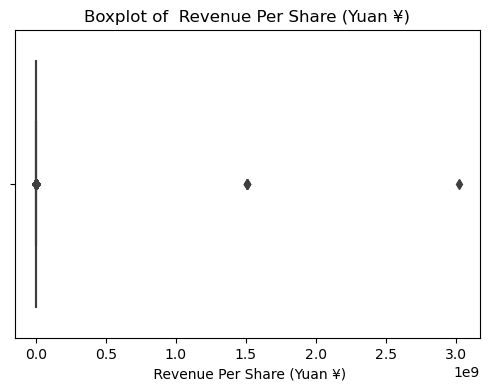

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


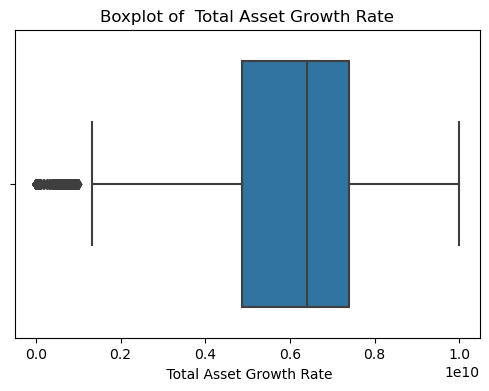

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


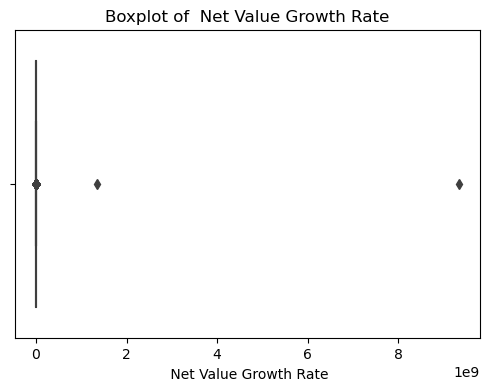

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


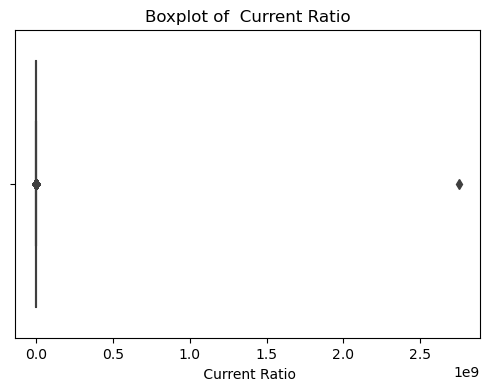

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


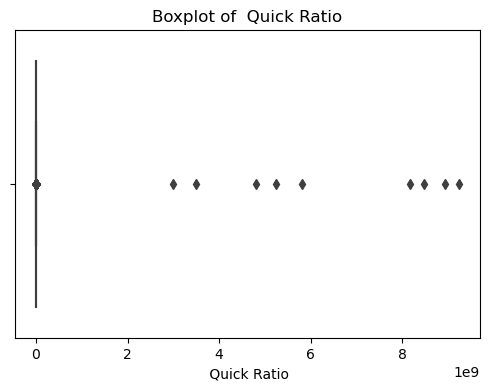

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


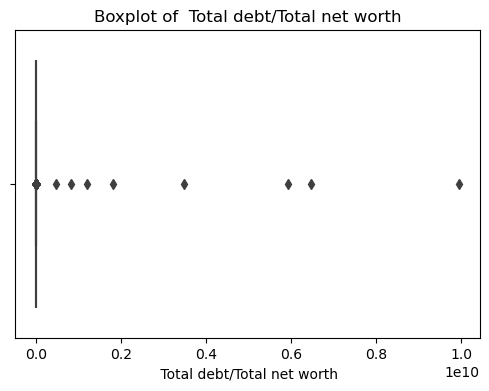

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


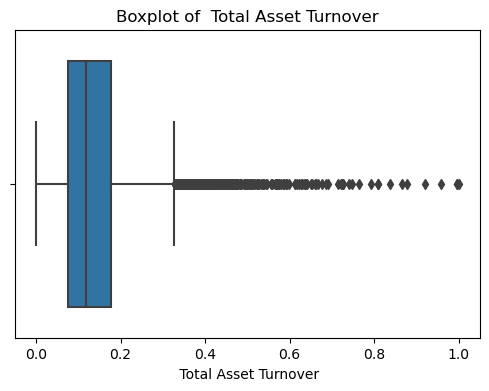

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


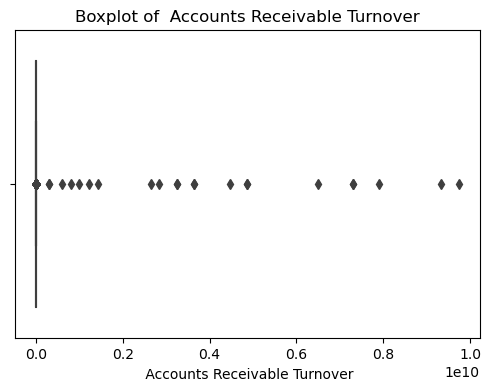

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


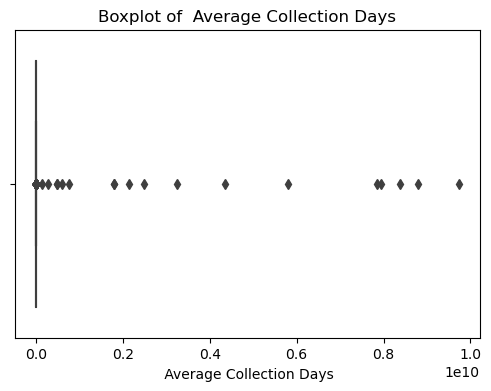

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


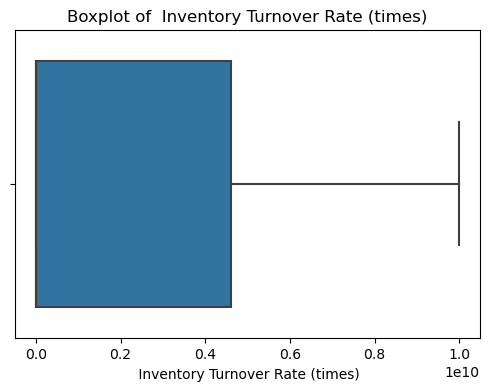

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


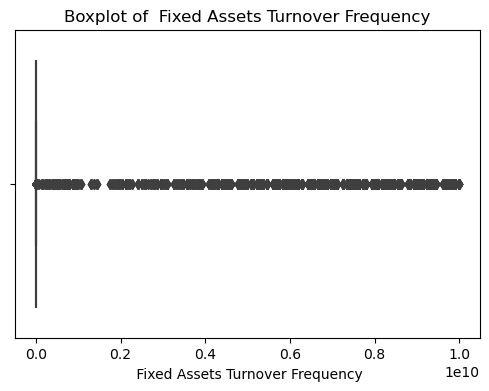

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


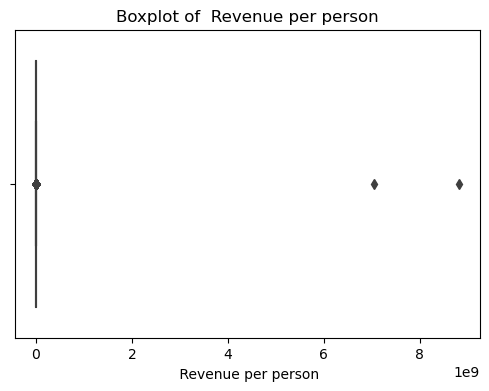

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


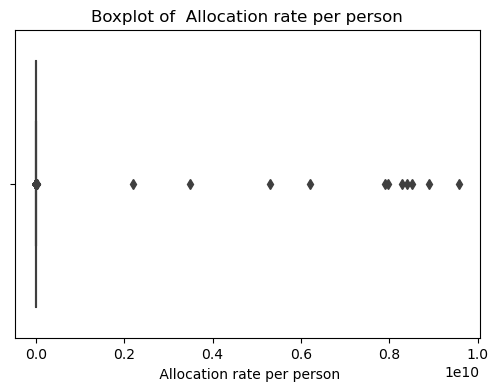

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


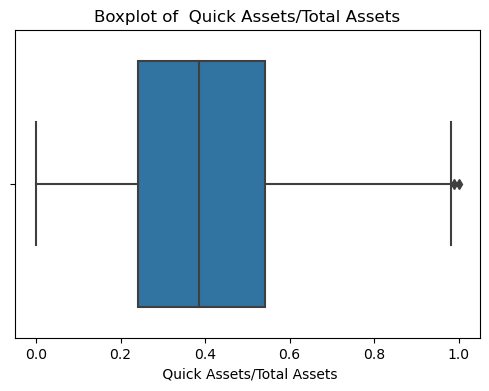

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


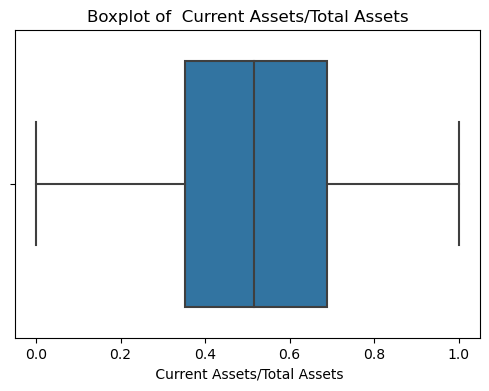

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


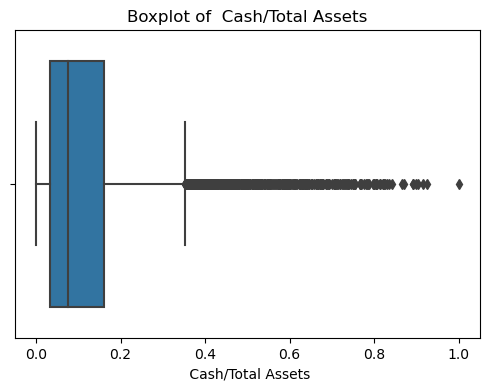

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


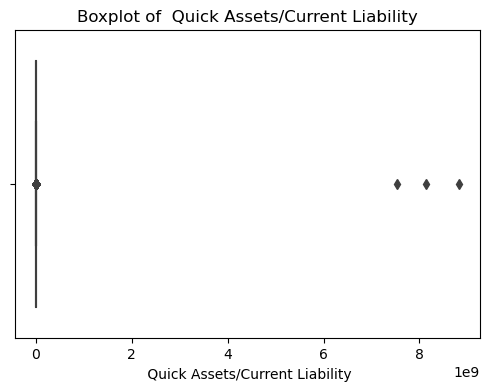

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


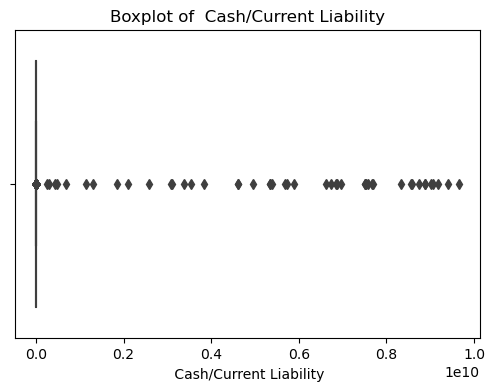

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


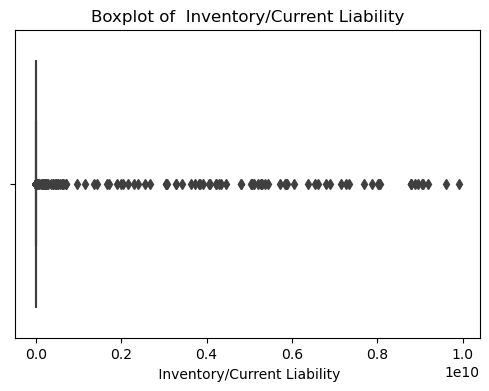

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


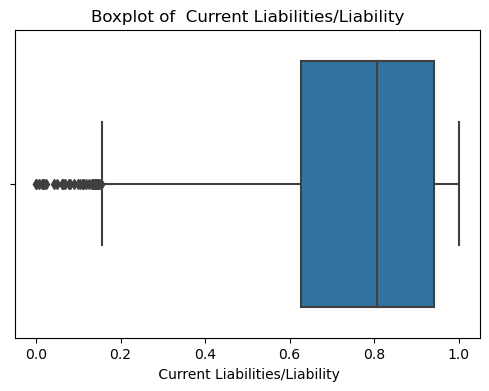

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


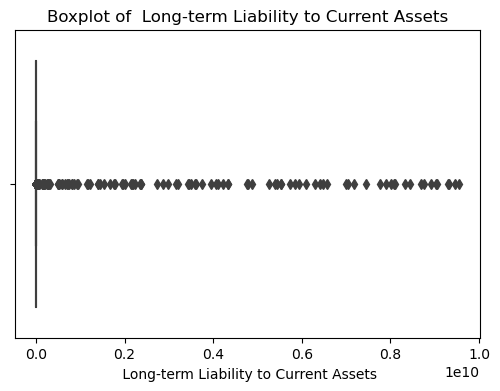

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


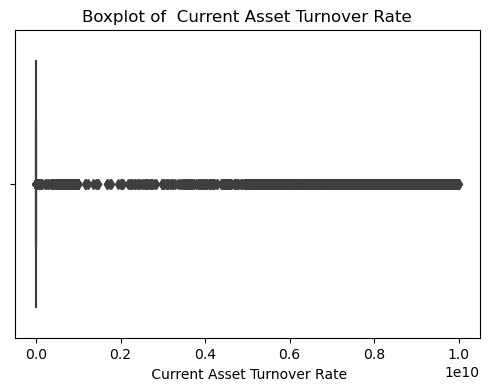

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


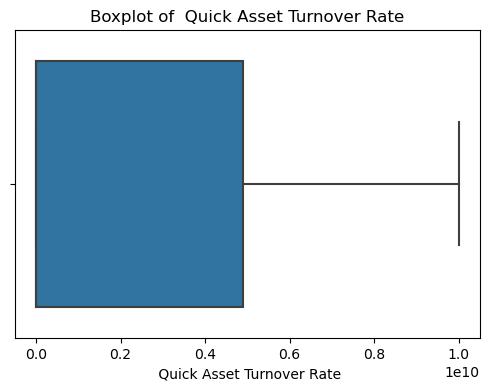

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


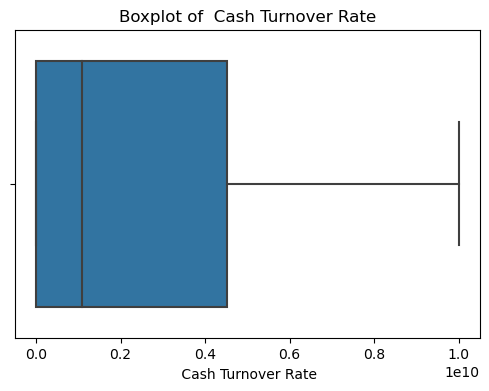

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


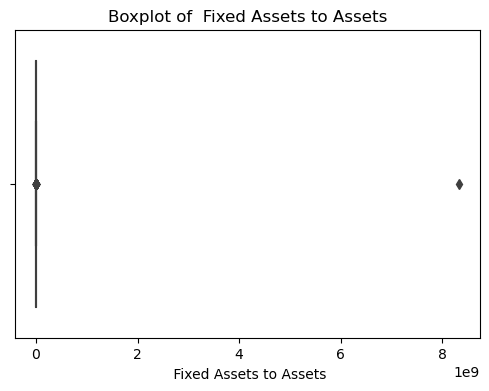

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


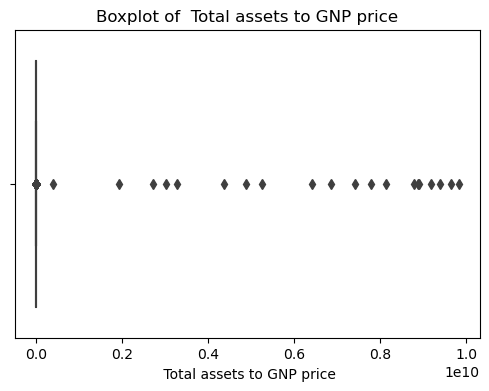

In [120]:
for col in data.columns:
    plt.figure(figsize=(6,4))
    sns.boxplot(data[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

In [121]:
# we have a shitload of outliers in our dataset so we might get back to this 

In [122]:
X= data.drop(columns="Bankrupt?")
y= data["Bankrupt?"]

In [123]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test= train_test_split(X, y, test_size=.2, random_state=42)

In [124]:
# note we are choosing Standard Scaler vs MinMax because the 1st one is less sensitive to outliers 

from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
X_train_scaled= scaler.fit_transform(X_train)
X_test_scaled= scaler.transform(X_test)

# Modeling

What is SGD Classifier?

SGD Classifier implements regularised linear models with Stochastic Gradient Descent.

So, what is stochastic gradient descent?

Stochastic gradient descent considers only 1 random point while changing weights unlike gradient descent which considers the whole training data.
As such stochastic gradient descent is much faster than gradient descent when dealing with large data sets.

In [238]:
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, roc_auc_score, roc_curve


In [127]:
# We use Grid search to find the best parameters for accuracy

from sklearn.model_selection import GridSearchCV

loss = ['hinge', 'log_loss', 'log', 'modified_huber', 'squared_hinge', 'perceptron', 'squared_error', 'huber', 'epsilon_insensitive', 'squared_epsilon_insensitive']
penalty = ['l2', 'l1', 'elasticnet', None]
Cs = [.01, .1, 1, 10, 100]

tuned_parameters = {'loss': loss, 'penalty': penalty, 'alpha': Cs}

model = GridSearchCV(SGDClassifier(), tuned_parameters, scoring = 'accuracy', cv=2)

In [128]:
model.fit(X_train, Y_train)

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
 

GridSearchCV(cv=2, estimator=SGDClassifier(),
             param_grid={'alpha': [0.01, 0.1, 1, 10, 100],
                         'loss': ['hinge', 'log_loss', 'log', 'modified_huber',
                                  'squared_hinge', 'perceptron',
                                  'squared_error', 'huber',
                                  'epsilon_insensitive',
                                  'squared_epsilon_insensitive'],
                         'penalty': ['l2', 'l1', 'elasticnet', None]},
             scoring='accuracy')

In [130]:
model.best_params_

{'alpha': 1, 'loss': 'squared_hinge', 'penalty': 'elasticnet'}

In [244]:
# We fit the model (best accuracy)

sgdc = SGDClassifier(loss="squared_hinge", penalty="elasticnet", max_iter=1000, alpha=1, random_state=42)
sgdc.fit(X_train, Y_train)

SGDClassifier(alpha=1, loss='squared_hinge', penalty='elasticnet',
              random_state=42)

In [245]:
prediction_train = sgdc.predict(X_train)
prediction_test = sgdc.predict(X_test)

acc_train = accuracy_score(Y_train, prediction_train)
acc_test = accuracy_score(Y_test, prediction_test)

prec_train = precision_score(Y_train, prediction_train)
prec_test = precision_score(Y_test, prediction_test)

recall_train = recall_score(Y_train, prediction_train)
recall_test = recall_score(Y_test, prediction_test)
  
print(f"Training: Accuracy = {round(acc_train, 2)}, Precision = {round(prec_train, 2)}, Recall = {round(recall_train, 2)}")
print(f"Testing: Accuracy = {round(acc_test, 2)}, Precision = {round(prec_test, 2)}, Recall = {round(recall_test, 2)}")
print()
print(f"Classifier Report : \n\n {classification_report(Y_test, prediction_test)}")

Training: Accuracy = 0.97, Precision = 0.24, Recall = 0.04
Testing: Accuracy = 0.95, Precision = 0.07, Recall = 0.02

Classifier Report : 

               precision    recall  f1-score   support

           0       0.96      0.99      0.98      1313
           1       0.07      0.02      0.03        51

    accuracy                           0.95      1364
   macro avg       0.52      0.50      0.50      1364
weighted avg       0.93      0.95      0.94      1364



In [246]:
# We predict and check the accuracy

y_pred = sgdc.predict(X_test)

cm = confusion_matrix(Y_test, y_pred)
print(cm) 

[[1300   13]
 [  50    1]]


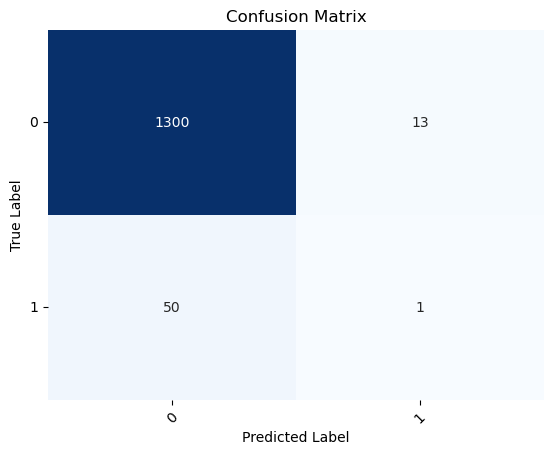

In [247]:
# Create a figure and axis
fig, ax = plt.subplots()

# Plot the confusion matrix
sns.heatmap(confusion_matrix(Y_test, y_pred), annot=True, cmap='Blues', fmt='g', cbar=False, ax=ax)

# Set labels, title, and ticks
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
ax.set_title('Confusion Matrix')

# Rotate the tick labels for better visibility
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Display the plot
plt.show()

In [176]:
# We use Grid search to find the best parameters for recall

from sklearn.model_selection import GridSearchCV

loss = ['hinge', 'log_loss', 'log', 'modified_huber', 'squared_hinge', 'perceptron', 'squared_error', 'huber', 'epsilon_insensitive', 'squared_epsilon_insensitive']
penalty = ['l2', 'l1', 'elasticnet', None]
Cs = [.01, .1, 1, 10, 100]

tuned_parameters = {'loss': loss, 'penalty': penalty, 'alpha': Cs}

model = GridSearchCV(SGDClassifier(), tuned_parameters, scoring = 'recall', cv=2)

In [177]:
model.fit(X_train, Y_train)

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
 

GridSearchCV(cv=2, estimator=SGDClassifier(),
             param_grid={'alpha': [0.01, 0.1, 1, 10, 100],
                         'loss': ['hinge', 'log_loss', 'log', 'modified_huber',
                                  'squared_hinge', 'perceptron',
                                  'squared_error', 'huber',
                                  'epsilon_insensitive',
                                  'squared_epsilon_insensitive'],
                         'penalty': ['l2', 'l1', 'elasticnet', None]},
             scoring='recall')

In [140]:
model.best_params_

{'alpha': 0.1, 'loss': 'squared_epsilon_insensitive', 'penalty': None}

In [248]:
# We fit the model (best recall)

sgdc = SGDClassifier(loss="squared_epsilon_insensitive", penalty=None, max_iter=1000, alpha=0.1, random_state=42)
sgdc.fit(X_train, Y_train)

SGDClassifier(alpha=0.1, loss='squared_epsilon_insensitive', penalty=None,
              random_state=42)

In [249]:
# We predict and check the recall

y_pred = sgdc.predict(X_test)

cm = confusion_matrix(Y_test, y_pred)
print(cm) 

[[1249   64]
 [  47    4]]


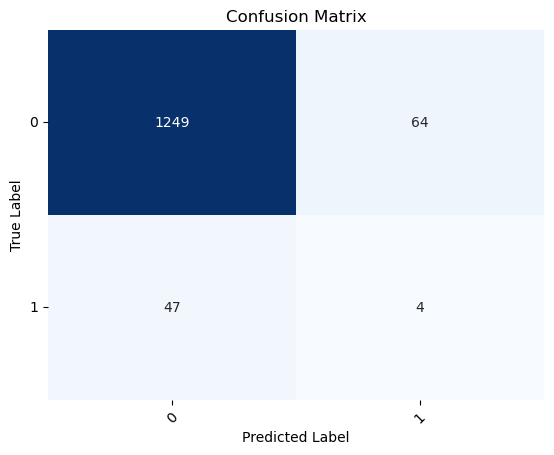

In [250]:
# Create a figure and axis
fig, ax = plt.subplots()

# Plot the confusion matrix
sns.heatmap(confusion_matrix(Y_test, y_pred), annot=True, cmap='Blues', fmt='g', cbar=False, ax=ax)

# Set labels, title, and ticks
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
ax.set_title('Confusion Matrix')

# Rotate the tick labels for better visibility
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Display the plot
plt.show()

In [251]:
prediction_train = sgdc.predict(X_train)
prediction_test = sgdc.predict(X_test)

acc_train = accuracy_score(Y_train, prediction_train)
acc_test = accuracy_score(Y_test, prediction_test)

prec_train = precision_score(Y_train, prediction_train)
prec_test = precision_score(Y_test, prediction_test)

recall_train = recall_score(Y_train, prediction_train)
recall_test = recall_score(Y_test, prediction_test)
  
print(f"Training: Accuracy = {round(acc_train, 2)}, Precision = {round(prec_train, 2)}, Recall = {round(recall_train, 2)}")
print(f"Testing: Accuracy = {round(acc_test, 2)}, Precision = {round(prec_test, 2)}, Recall = {round(recall_test, 2)}")
print()
print(f"Classifier Report : \n\n {classification_report(Y_test, prediction_test)}")

Training: Accuracy = 0.93, Precision = 0.04, Recall = 0.05
Testing: Accuracy = 0.92, Precision = 0.06, Recall = 0.08

Classifier Report : 

               precision    recall  f1-score   support

           0       0.96      0.95      0.96      1313
           1       0.06      0.08      0.07        51

    accuracy                           0.92      1364
   macro avg       0.51      0.51      0.51      1364
weighted avg       0.93      0.92      0.92      1364



So far, it looks like the best model.
Let's see now if we can improve our model handling imbalance imbalance with oversampling minority.

# Dealing with imbalance

In [146]:
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.2, random_state=42)

In [147]:
scaler= StandardScaler().fit(X_train)
X_train_scaled_db= pd.DataFrame(scaler.transform(X_train), columns=X.columns)

In [148]:
new_data= X_train_scaled_db.join(y_train)
new_data

,Operating Expense Rate,Research and development expense rate,Interest-bearing debt interest rate,Tax rate (A),Revenue Per Share (Yuan ¥),Total Asset Growth Rate,Net Value Growth Rate,Current Ratio,Quick Ratio,Total debt/Total net worth,...,Cash/Current Liability,Inventory/Current Liability,Current Liabilities/Liability,Long-term Liability to Current Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Cash Turnover Rate,Fixed Assets to Assets,Total assets to GNP price,Bankrupt?
0,1.53,0.29,-0.15,0.77,-0.03,0.01,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-1.64,-0.09,2.93,1.25,0.03,0.62,-0.05,1.00
1,-0.62,-0.75,-0.15,-0.84,-0.03,-1.92,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,1.07,-0.09,-0.42,-0.64,-0.84,-1.18,-0.05,1.00
2,-0.62,-0.75,-0.15,0.54,-0.03,-1.92,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.59,-0.09,-0.42,-0.64,-0.53,-0.49,-0.05,1.00
3,-0.52,-0.75,-0.15,1.02,-0.03,1.27,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.15,-0.09,2.09,1.21,-0.84,-0.36,-0.05,1.00
4,-0.62,-0.75,-0.15,0.25,-0.03,0.34,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.08,-0.09,-0.42,2.12,-0.58,-0.65,-0.05,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5450,0.27,-0.47,-0.15,0.74,-0.03,0.37,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.96,-0.09,3.11,1.41,-0.84,-0.84,-0.05,0.00
5451,-0.62,2.30,-0.15,-0.75,-0.03,0.77,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.88,-0.09,-0.42,-0.64,1.98,-0.04,-0.05,0.00
5452,-0.62,-0.75,-0.15,-0.41,-0.03,0.11,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.93,-0.09,-0.42,2.21,-0.84,-1.08,-0.05,0.00
5453,-0.62,-0.75,-0.15,-0.14,-0.03,-1.63,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,1.15,-0.09,-0.42,2.31,-0.84,0.19,-0.05,0.00


In [149]:
bankrupted=new_data.loc[new_data["Bankrupt?"]==1]
not_bankrupted=new_data.loc[new_data["Bankrupt?"]==0]

In [150]:
bankrupted

,Operating Expense Rate,Research and development expense rate,Interest-bearing debt interest rate,Tax rate (A),Revenue Per Share (Yuan ¥),Total Asset Growth Rate,Net Value Growth Rate,Current Ratio,Quick Ratio,Total debt/Total net worth,...,Cash/Current Liability,Inventory/Current Liability,Current Liabilities/Liability,Long-term Liability to Current Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Cash Turnover Rate,Fixed Assets to Assets,Total assets to GNP price,Bankrupt?
0,1.53,0.29,-0.15,0.77,-0.03,0.01,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-1.64,-0.09,2.93,1.25,0.03,0.62,-0.05,1.00
1,-0.62,-0.75,-0.15,-0.84,-0.03,-1.92,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,1.07,-0.09,-0.42,-0.64,-0.84,-1.18,-0.05,1.00
2,-0.62,-0.75,-0.15,0.54,-0.03,-1.92,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.59,-0.09,-0.42,-0.64,-0.53,-0.49,-0.05,1.00
3,-0.52,-0.75,-0.15,1.02,-0.03,1.27,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.15,-0.09,2.09,1.21,-0.84,-0.36,-0.05,1.00
4,-0.62,-0.75,-0.15,0.25,-0.03,0.34,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.08,-0.09,-0.42,2.12,-0.58,-0.65,-0.05,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4788,-0.62,-0.42,-0.15,1.03,-0.03,0.77,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.23,-0.09,3.06,2.18,2.05,-0.73,-0.05,1.00
5070,1.14,0.92,-0.15,-0.84,-0.03,0.25,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.15,-0.09,-0.42,-0.64,-0.84,2.06,-0.05,1.00
5148,-0.62,1.76,-0.15,-0.41,-0.03,0.73,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-1.52,-0.09,-0.42,-0.64,2.34,2.20,-0.05,1.00
5228,-0.62,-0.75,-0.15,-0.84,-0.03,-1.92,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,1.15,-0.09,-0.42,-0.64,-0.84,-0.96,-0.05,1.00


In [151]:
from sklearn.utils import resample
bankrupt_oversampled= resample(bankrupted, 
                               replace=True, 
                               n_samples= len(not_bankrupted),
                               random_state=0)
type(bankrupt_oversampled)
type(not_bankrupted)

pandas.core.frame.DataFrame

In [152]:
# add oversampled data to original data

training_oversampled= pd.concat([bankrupt_oversampled, not_bankrupted])

In [153]:
training_oversampled

,Operating Expense Rate,Research and development expense rate,Interest-bearing debt interest rate,Tax rate (A),Revenue Per Share (Yuan ¥),Total Asset Growth Rate,Net Value Growth Rate,Current Ratio,Quick Ratio,Total debt/Total net worth,...,Cash/Current Liability,Inventory/Current Liability,Current Liabilities/Liability,Long-term Liability to Current Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Cash Turnover Rate,Fixed Assets to Assets,Total assets to GNP price,Bankrupt?
1213,0.55,0.97,-0.15,-0.13,-0.03,1.45,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,1.03,-0.09,1.96,1.39,-0.84,-1.16,-0.05,1.00
2523,-0.62,0.21,-0.15,-0.84,-0.03,0.72,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-0.37,-0.09,-0.42,-0.64,-0.84,1.04,-0.05,1.00
1751,1.00,-0.75,-0.15,0.08,-0.03,-0.28,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.67,-0.09,1.65,0.86,-0.36,-0.45,-0.05,1.00
2097,-0.62,-0.75,-0.15,1.17,-0.03,-1.70,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-1.49,-0.09,-0.42,-0.64,0.55,0.09,-0.05,1.00
55,-0.62,0.89,-0.15,-0.84,-0.03,0.51,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,-1.23,-0.09,-0.42,-0.64,-0.84,2.54,-0.05,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5450,0.27,-0.47,-0.15,0.74,-0.03,0.37,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.96,-0.09,3.11,1.41,-0.84,-0.84,-0.05,0.00
5451,-0.62,2.30,-0.15,-0.75,-0.03,0.77,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.88,-0.09,-0.42,-0.64,1.98,-0.04,-0.05,0.00
5452,-0.62,-0.75,-0.15,-0.41,-0.03,0.11,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,0.93,-0.09,-0.42,2.21,-0.84,-1.08,-0.05,0.00
5453,-0.62,-0.75,-0.15,-0.14,-0.03,-1.63,-0.01,-0.01,-0.03,-0.03,...,-0.06,-0.10,1.15,-0.09,-0.42,2.31,-0.84,0.19,-0.05,0.00


# Retrying our model

In [154]:
X_train_over= training_oversampled.drop(columns="Bankrupt?")
y_train_over= training_oversampled["Bankrupt?"]

In [155]:
from sklearn.model_selection import train_test_split
X_train_over, X_test, y_train_over, Y_test= train_test_split(X, y, test_size=.2, random_state=42)

In [156]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
X_train_scaled= scaler.fit_transform(X_train_over)
X_test_scaled= scaler.transform(X_test)

In [157]:
# We use Grid search to find the best parameters for accuracy

from sklearn.model_selection import GridSearchCV

loss = ['hinge', 'log_loss', 'log', 'modified_huber', 'squared_hinge', 'perceptron', 'squared_error', 'huber', 'epsilon_insensitive', 'squared_epsilon_insensitive']
penalty = ['l2', 'l1', 'elasticnet', None]
Cs = [.01, .1, 1, 10, 100]

tuned_parameters = {'loss': loss, 'penalty': penalty, 'alpha': Cs}

model = GridSearchCV(SGDClassifier(), tuned_parameters, scoring = 'accuracy', cv=2)

In [158]:
model.fit(X_train_over, y_train_over)

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
 

GridSearchCV(cv=2, estimator=SGDClassifier(),
             param_grid={'alpha': [0.01, 0.1, 1, 10, 100],
                         'loss': ['hinge', 'log_loss', 'log', 'modified_huber',
                                  'squared_hinge', 'perceptron',
                                  'squared_error', 'huber',
                                  'epsilon_insensitive',
                                  'squared_epsilon_insensitive'],
                         'penalty': ['l2', 'l1', 'elasticnet', None]},
             scoring='accuracy')

In [160]:
model.best_params_

{'alpha': 1, 'loss': 'modified_huber', 'penalty': 'l2'}

In [261]:
# We fit the model (best accuracy)

sgdc = SGDClassifier(loss="modified_huber", penalty="l2", max_iter=1000, alpha=1, random_state=42)
sgdc.fit(X_train_over, y_train_over)

SGDClassifier(alpha=1, loss='modified_huber', random_state=42)

In [263]:
# We predict and check the accuracy

y_pred = sgdc.predict(X_test)

cm = confusion_matrix(Y_test, y_pred)
print(cm) 

[[1304    9]
 [  50    1]]


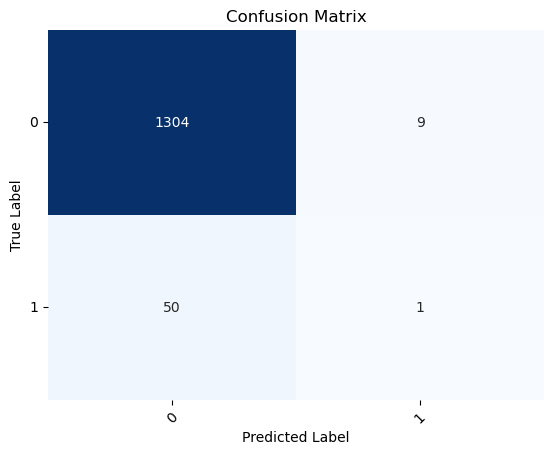

In [264]:
# Create a figure and axis
fig, ax = plt.subplots()

# Plot the confusion matrix
sns.heatmap(confusion_matrix(Y_test, y_pred), annot=True, cmap='Blues', fmt='g', cbar=False, ax=ax)

# Set labels, title, and ticks
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
ax.set_title('Confusion Matrix')

# Rotate the tick labels for better visibility
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Display the plot
plt.show()

In [265]:
prediction_train = sgdc.predict(X_train_over)
prediction_test = sgdc.predict(X_test)

acc_train = accuracy_score(y_train_over, prediction_train)
acc_test = accuracy_score(Y_test, prediction_test)

prec_train = precision_score(y_train_over, prediction_train)
prec_test = precision_score(Y_test, prediction_test)

recall_train = recall_score(y_train_over, prediction_train)
recall_test = recall_score(Y_test, prediction_test)
  
print(f"Training: Accuracy = {round(acc_train, 2)}, Precision = {round(prec_train, 2)}, Recall = {round(recall_train, 2)}")
print(f"Testing: Accuracy = {round(acc_test, 2)}, Precision = {round(prec_test, 2)}, Recall = {round(recall_test, 2)}")
print()
print(f"Classifier Report : \n\n {classification_report(Y_test, prediction_test)}")

Training: Accuracy = 0.97, Precision = 0.05, Recall = 0.01
Testing: Accuracy = 0.96, Precision = 0.1, Recall = 0.02

Classifier Report : 

               precision    recall  f1-score   support

           0       0.96      0.99      0.98      1313
           1       0.10      0.02      0.03        51

    accuracy                           0.96      1364
   macro avg       0.53      0.51      0.51      1364
weighted avg       0.93      0.96      0.94      1364



In [192]:
# We use Grid search to find the best parameters for recall

from sklearn.model_selection import GridSearchCV

loss = ['hinge', 'log_loss', 'log', 'modified_huber', 'squared_hinge', 'perceptron', 'squared_error', 'huber', 'epsilon_insensitive', 'squared_epsilon_insensitive']
penalty = ['l2', 'l1', 'elasticnet', None]
Cs = [.01, .1, 1, 10, 100]

tuned_parameters = {'loss': loss, 'penalty': penalty, 'alpha': Cs}

model = GridSearchCV(SGDClassifier(), tuned_parameters, scoring = 'recall', cv=2)

In [194]:
model.fit(X_train_over, y_train_over)

/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/Users/axelemahalin/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_stochastic_gradient.py:696: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
 

GridSearchCV(cv=2, estimator=SGDClassifier(),
             param_grid={'alpha': [0.01, 0.1, 1, 10, 100],
                         'loss': ['hinge', 'log_loss', 'log', 'modified_huber',
                                  'squared_hinge', 'perceptron',
                                  'squared_error', 'huber',
                                  'epsilon_insensitive',
                                  'squared_epsilon_insensitive'],
                         'penalty': ['l2', 'l1', 'elasticnet', None]},
             scoring='recall')

In [195]:
model.best_params_

{'alpha': 0.01, 'loss': 'squared_epsilon_insensitive', 'penalty': None}

In [266]:
# We fit the model (best recall)

sgdc = SGDClassifier(loss="squared_epsilon_insensitive", penalty=None, max_iter=1000, alpha=0.01, random_state=42)
sgdc.fit(X_train_over, y_train_over)

SGDClassifier(alpha=0.01, loss='squared_epsilon_insensitive', penalty=None,
              random_state=42)

In [267]:
# We predict and check the recall

y_pred = sgdc.predict(X_test)

cm = confusion_matrix(Y_test, y_pred)
print(cm) 

[[944 369]
 [ 28  23]]


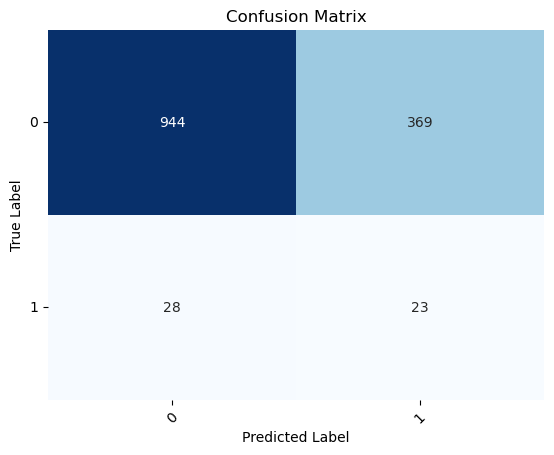

In [259]:
# Create a figure and axis
fig, ax = plt.subplots()

# Plot the confusion matrix
sns.heatmap(confusion_matrix(Y_test, y_pred), annot=True, cmap='Blues', fmt='g', cbar=False, ax=ax)

# Set labels, title, and ticks
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
ax.set_title('Confusion Matrix')

# Rotate the tick labels for better visibility
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Display the plot
plt.show()

In [268]:
prediction_train = sgdc.predict(X_train_over)
prediction_test = sgdc.predict(X_test)

acc_train = accuracy_score(y_train_over, prediction_train)
acc_test = accuracy_score(Y_test, prediction_test)

prec_train = precision_score(y_train_over, prediction_train)
prec_test = precision_score(Y_test, prediction_test)

recall_train = recall_score(y_train_over, prediction_train)
recall_test = recall_score(Y_test, prediction_test)
  
print(f"Training: Accuracy = {round(acc_train, 2)}, Precision = {round(prec_train, 2)}, Recall = {round(recall_train, 2)}")
print(f"Testing: Accuracy = {round(acc_test, 2)}, Precision = {round(prec_test, 2)}, Recall = {round(recall_test, 2)}")
print()
print(f"Classifier Report : \n\n {classification_report(Y_test, prediction_test)}")

Training: Accuracy = 0.7, Precision = 0.04, Recall = 0.38
Testing: Accuracy = 0.71, Precision = 0.06, Recall = 0.45

Classifier Report : 

               precision    recall  f1-score   support

           0       0.97      0.72      0.83      1313
           1       0.06      0.45      0.10        51

    accuracy                           0.71      1364
   macro avg       0.51      0.58      0.47      1364
weighted avg       0.94      0.71      0.80      1364



So after comparing the results, the scores are not as good as before (expect for the recall score), so in theory we should have tried undersampling but because of a matter of time, we'll choose the previous best model and draw the ROC Curve.

# ROC Curve

In [269]:
# We take back the previous best model to draw the ROC Curve

sgdc = SGDClassifier(loss="squared_epsilon_insensitive", penalty=None, max_iter=1000, alpha=0.1, random_state=42)
sgdc.fit(X_train, y_train)

# We predict and check the recall

y_pred = sgdc.predict(X_test)

In [274]:
prediction_train = sgdc.predict(X_train)
prediction_test = sgdc.predict(X_test)

acc_train = accuracy_score(y_train, prediction_train)
acc_test = accuracy_score(y_test, prediction_test)

prec_train = precision_score(y_train, prediction_train)
prec_test = precision_score(y_test, prediction_test)

recall_train = recall_score(y_train, prediction_train)
recall_test = recall_score(y_test, prediction_test)
  
print(f"Training: Accuracy = {round(acc_train, 2)}, Precision = {round(prec_train, 2)}, Recall = {round(recall_train, 2)}")
print(f"Testing: Accuracy = {round(acc_test, 2)}, Precision = {round(prec_test, 2)}, Recall = {round(recall_test, 2)}")
print()
print(f"Classifier Report : \n\n {classification_report(y_test, prediction_test)}")

Training: Accuracy = 0.93, Precision = 0.04, Recall = 0.05
Testing: Accuracy = 0.92, Precision = 0.06, Recall = 0.08

Classifier Report : 

               precision    recall  f1-score   support

           0       0.96      0.95      0.96      1313
           1       0.06      0.08      0.07        51

    accuracy                           0.92      1364
   macro avg       0.51      0.51      0.51      1364
weighted avg       0.93      0.92      0.92      1364



In [275]:
roc_auc_score(y_test, y_pred)

0.5148440183384854

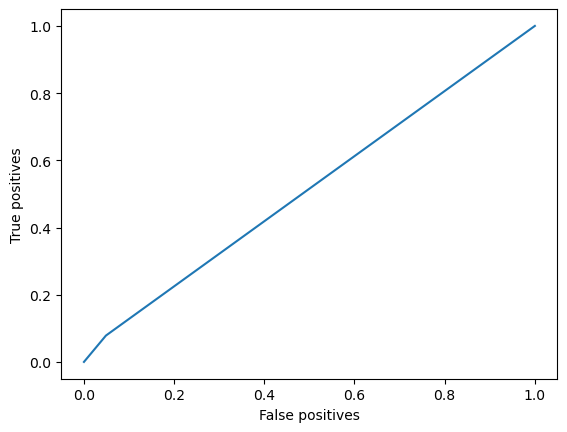

In [276]:
# plot roc_auc curve 

fp, tp, _ = roc_curve(y_test, y_pred)
fig = plt.plot(fp, tp)
plt.xlabel('False positives')
plt.ylabel('True positives');

plt.show()